# Projet Big Data

# Traitement des données
### Import librairies et données

In [1]:
#Importation des librairies
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import re
from nltk import sent_tokenize
import nltk
from deep_translator import GoogleTranslator
from nltk.corpus import stopwords
from nltk.tokenize import RegexpTokenizer
import shapefile
from shapely.geometry import Point # Point class
from shapely.geometry import shape # shape() is a function to convert geo objects through the interface

In [2]:
# Import des données 
df = pd.read_csv("../Data/33000-BORDEAUX_nettoye.csv")

In [3]:
#affiche de quelques lignes au hasard
pd.set_option('display.max_columns', None)
df.sample(3)

,Identifiant,Url,Titre,PrixNuitee,Latitude,Longitude,Resume,Capacite_accueil,NombreSdB,NbChambres,NbLits,Type_logement,type_propriete,type_lit,Animal_sur_place,Cuisine,Internet,television,produits_base,Shampooing,Chauffage,Climatisation,machine_laver,seche_linge,parking_sur-place,wifi,television_cable,petit_dejeuner,animaux_acceptes,pourEnfants_famille,adapte_evenements,logement_fumeur,accessibilite,Ascenseur,cheminee_interieur,Interphone,Portier,Piscine,Jacuzzi,salle_sport,Entree_24-24,Cintres,fer_repasser,seche_cheveux,espace_travail_ordi,detecteur_fumee,monoxyde_carbone_detect,kit_secours,fiche_securite,extincteur,porte_chambre_verrou,prix_nuitee,rection_semaine,reduction_mois,surcout_voyageur_supp,frais_menage,Caution,conditions_annulation,Description,reglement_interieur,duree_minimale_sejour
2916,11886812,https://www.airbnb.fr/rooms/11886812,Bel appartement 50m2,70,44.857687,-0.563970,"Bel appartement lumineux de 50m2, la chambre a...",2,1,1,1,Logement entier,Appartement,NaN,NaN,1,0,1,1,0,1,1,1,0,1,1,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,1,0,0,1,1,0,0,0,0,0,70,15,0,0,5,300,Flexibles,"Le logement\n\nCalme, confortable et très lumi...",Ne convient pas aux animaux\n\nPas de fête ni ...,1
2330,9688231,https://www.airbnb.fr/rooms/9688231,Double room in a quiet flat,40,44.835820,-0.578687,"It's a new-build flat, fully-equipped, right i...",1,1,1,0,Chambre privée,Appartement,Vrai lit,NaN,1,1,1,1,0,1,0,1,0,0,1,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,40,0,0,0,0,0,NaN,Le logement\n\nI work from home so between 9-6...,Make yourself at home - but please no parties.,1
5116,14865222,https://www.airbnb.fr/rooms/14865222,T3 hypercentre 90m² Place de la bourse - St Pi...,100,44.839478,-0.572618,Situé Place du parlement à 150 m de la Place d...,6,2,2,0,Logement entier,Appartement,NaN,NaN,1,1,1,1,0,1,0,1,0,0,1,1,1,1,1,0,1,0,0,0,1,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,100,0,0,15,10,0,NaN,Le logement\n\nSitué au premier étage d'un imm...,Pas de fête ni de soirée\n\nL'heure d'entrée d...,1


In [4]:
print('nombre de lignes (initalement) : '+ str(df.shape[0]))
print('nombre de colonnes (initialement) : '+ str(df.shape[1]))

nombre de lignes (initalement) : 5237
nombre de colonnes (initialement) : 61


In [5]:
#liste des colonnes
#list_columns = df.columns.values.tolist()
#for i in range(len(list_columns)):
    #print(list_columns[i])

### Début du traitement
#### Suppression de lignes, colonnes / renommage de colonnes / modifications de valeurs

In [6]:
#suppression colonne URL car inutile pour notre analyse
del df["Url"]

In [7]:
#suppression des colonnes en double
for column in df:
    for col in df:
        if column != col:
            if df[column].equals(df[col]) == True:
                print('column : ', column, '\ncol : ', col, '\n',df[column].equals(df[col]))
#colonne PrixNuitee = prix_nuitee (en double), on la supprime
del df["prix_nuitee"]                 

column :  PrixNuitee 
col :  prix_nuitee 
 True
column :  prix_nuitee 
col :  PrixNuitee 
 True


In [8]:
#remplacement des valeurs NA par des 0 peu importe la colonne (texte, nombre, ...)
#for column in df:
    #print(pd.isna(df[column]))

#df.fillna(value = 0, inplace = True)

# finalement on ne le fait pas, pas cohérent pour l'analyse

In [9]:
#print('valeurs max :\n')
#for column in df:
    #if df[column].dtypes == 'int64' or df[column].dtypes == 'float64':
        #print(column, ' : ',df[column].max())

#print('\n\nvaleurs min :\n')
#for column in df:
    #if df[column].dtypes == 'int64' or df[column].dtypes == 'float64':
        #print(column, ' : ',df[column].min())
        
for column in df:
    if(df[column].to_numpy() [0] == df[column].to_numpy() ).all(0)  == True:
        print('\ncolonne avec des valeurs uniques :\n', column, '| valeur : ', df[column].min())
        del df[column] #va supprimer la colonne shampooing car inutile, que des valeurs à 0


colonne avec des valeurs uniques :
 Shampooing | valeur :  0


In [10]:
df[df.duplicated() == 1]
#aucune ligne dupliquée !

,Identifiant,Titre,PrixNuitee,Latitude,Longitude,Resume,Capacite_accueil,NombreSdB,NbChambres,NbLits,Type_logement,type_propriete,type_lit,Animal_sur_place,Cuisine,Internet,television,produits_base,Chauffage,Climatisation,machine_laver,seche_linge,parking_sur-place,wifi,television_cable,petit_dejeuner,animaux_acceptes,pourEnfants_famille,adapte_evenements,logement_fumeur,accessibilite,Ascenseur,cheminee_interieur,Interphone,Portier,Piscine,Jacuzzi,salle_sport,Entree_24-24,Cintres,fer_repasser,seche_cheveux,espace_travail_ordi,detecteur_fumee,monoxyde_carbone_detect,kit_secours,fiche_securite,extincteur,porte_chambre_verrou,rection_semaine,reduction_mois,surcout_voyageur_supp,frais_menage,Caution,conditions_annulation,Description,reglement_interieur,duree_minimale_sejour


In [11]:
#renommage de la colonne rection_semaine en reduction_semaine
df.rename(columns = {'rection_semaine':'reduction_semaine'}, inplace = True)

In [12]:
#NombreSdB max aberrant : 75
#vérification mean et median
print('mean : ', df.NombreSdB.mean())
print('median : ', df.NombreSdB.median())

nb_SdB = 20
print(df.NombreSdB[df.NombreSdB > nb_SdB].count(), 'apparts avec + de', nb_SdB, 'SdB')

#display(df[df.NombreSdB > nb_SdB].sort_values(by=['NombreSdB']))

mean :  1.6690853542104258
median :  1.0
21 apparts avec + de 20 SdB


In [13]:
#Correction NombreSdB en ayant analysé les annonces airbnb
#Si 15 --> 1,5
#Si 25 --> 2,5
#Si 35 --> 3,5
#Si 75 --> 1

df.NombreSdB[df.NombreSdB == 15] = 1.5
df.NombreSdB[df.NombreSdB == 25] = 2.5
df.NombreSdB[df.NombreSdB == 35] = 3.5
df.NombreSdB[df.NombreSdB == 75] = 1

<ipython-input-13-c000d85b20fd>:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.NombreSdB[df.NombreSdB == 15] = 1.5


In [14]:
#Si capacité accueil < nb salle de bain ==> i.e. probleme
#df[pd.to_numeric(df["Capacite_accueil"]) < pd.to_numeric(df["NombreSdB"])]

In [15]:
#Si studio chambre T1 studette dans Titre --> NombreSdB = 1 pour cohérence data
df.loc[df['Titre'].str.contains('studio', case=False), 'NombreSdB'] = 1
df.loc[df['Titre'].str.contains('chambre', case=False), 'NombreSdB'] = 1
df.loc[df['Titre'].str.contains('T1', case=False), 'NombreSdB'] = 1
df.loc[df['Titre'].str.contains('studette', case=False), 'NombreSdB'] = 1

In [16]:
#suppressions des lignes ayant un prix nul
df = df[df['PrixNuitee'] != 0]
#suppression des lignes ayant des prix de plus de 200€
#df = df[df['PrixNuitee'] <= 200]

In [17]:
for column in df:
    if df[column].isnull().sum() / df.shape[0] *100 > 50:
        print(column)
        print(df[column].isnull().sum(), 'valeurs nulles')
        print(round(df[column].isnull().sum() / df.shape[0] *100, 2), "% de valeurs nulles\n")
        del df[column] 
        
#suppression colonne Animal_sur_place

type_lit
2860 valeurs nulles
54.64 % de valeurs nulles

Animal_sur_place
4844 valeurs nulles
92.55 % de valeurs nulles



In [18]:
print('nombre de lignes : '+ str(df.shape[0]))
print('nombre de colonnes : '+ str(df.shape[1]))

pd.set_option('display.max_columns', None)
df.sample(3)

nombre de lignes : 5234
nombre de colonnes : 56


,Identifiant,Titre,PrixNuitee,Latitude,Longitude,Resume,Capacite_accueil,NombreSdB,NbChambres,NbLits,Type_logement,type_propriete,Cuisine,Internet,television,produits_base,Chauffage,Climatisation,machine_laver,seche_linge,parking_sur-place,wifi,television_cable,petit_dejeuner,animaux_acceptes,pourEnfants_famille,adapte_evenements,logement_fumeur,accessibilite,Ascenseur,cheminee_interieur,Interphone,Portier,Piscine,Jacuzzi,salle_sport,Entree_24-24,Cintres,fer_repasser,seche_cheveux,espace_travail_ordi,detecteur_fumee,monoxyde_carbone_detect,kit_secours,fiche_securite,extincteur,porte_chambre_verrou,reduction_semaine,reduction_mois,surcout_voyageur_supp,frais_menage,Caution,conditions_annulation,Description,reglement_interieur,duree_minimale_sejour
4853,14174039,Chambre avec petit déjeuner Gare St jean,30,44.821730,-0.553836,Mon logement est proche de La gare\n.\n\nA un ...,1,1.0,1,0,Chambre privée,Bed & Breakfast,1,0,1,1,1,0,1,1,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,Flexibles,Le logement\n\nA un arrêt de tram de la gare\n...,Non fumeur\n\nNe convient pas aux animaux\n\nP...,1
358,2409719,Vue sur la Garonne,99,44.850302,-0.570075,"Bel appartement ancien, 4 pers, avec vue sur ...",4,1.0,1,0,Logement entier,Appartement,1,1,1,1,1,1,1,1,0,1,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,1,1,1,1,1,0,0,0,0,0,7,14,0,50,300,Modérées,"Le logement\n\nSitué au 2 ième étage, ( sans a...",Non fumeur\n\nNe convient pas aux animaux\n\nP...,2
1583,6907964,havre de paix dans Bordeaux,35,44.859085,-0.577931,Situé à 10 minutes en tram de l'hypercentre o...,2,1.0,1,1,Chambre privée,Appartement,1,1,0,1,1,0,1,0,1,1,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,1,1,0,0,0,0,0,0,0,Flexibles,Transports\n\nTram C situé à 100 mètres à pied...,NaN,1


#### Ajout du quartier

In [19]:
for i, row in df.iterrows():
    longitude = df.at[i, 'Longitude']
    latitude = df.at[i, 'Latitude']

    point_to_check = (longitude, latitude) # an x,y tuple
    shp = shapefile.Reader('../Data/se_quart_s/se_quart_s.shp') #open the shapefile
    all_shapes = shp.shapes() # get all the polygons
    all_records = shp.records()     
    for j in range(len(all_shapes)):
        boundary = all_shapes[j] # get a boundary polygon
        if Point(point_to_check).within(shape(boundary)): # make a point and see if it's in the polygon
            name = all_records[j][2] # get the second field of the corresponding record
            print("The point is in", name)
            df.at[i, "Quartier"] = name
            

The point is in Centre ville
The point is in Chartrons - Grand Parc - Jardin Public
The point is in Saint Augustin - Tauzin - Alphonse Dupeux
The point is in Bordeaux Sud
The point is in Centre ville
The point is in Centre ville
The point is in Chartrons - Grand Parc - Jardin Public
The point is in Centre ville
The point is in Centre ville
The point is in Centre ville
The point is in Centre ville
The point is in Centre ville
The point is in Centre ville
The point is in Bordeaux Sud
The point is in Nansouty - Saint Genès
The point is in La Bastide
The point is in Bordeaux Sud
The point is in Centre ville
The point is in Chartrons - Grand Parc - Jardin Public
The point is in Chartrons - Grand Parc - Jardin Public
The point is in Chartrons - Grand Parc - Jardin Public
The point is in Bordeaux Sud
The point is in Centre ville
The point is in Saint Augustin - Tauzin - Alphonse Dupeux
The point is in Saint Augustin - Tauzin - Alphonse Dupeux
The point is in Bordeaux Sud
The point is in Borde

The point is in Centre ville
The point is in Bordeaux Sud
The point is in Centre ville
The point is in Chartrons - Grand Parc - Jardin Public
The point is in Saint Augustin - Tauzin - Alphonse Dupeux
The point is in Centre ville
The point is in Caudéran
The point is in Bordeaux Sud
The point is in Centre ville
The point is in Bordeaux Sud
The point is in Saint Augustin - Tauzin - Alphonse Dupeux
The point is in Bordeaux Maritime
The point is in Saint Augustin - Tauzin - Alphonse Dupeux
The point is in Centre ville
The point is in Caudéran
The point is in Bordeaux Sud
The point is in Centre ville
The point is in Saint Augustin - Tauzin - Alphonse Dupeux
The point is in Bordeaux Sud
The point is in Chartrons - Grand Parc - Jardin Public
The point is in Chartrons - Grand Parc - Jardin Public
The point is in Nansouty - Saint Genès
The point is in Chartrons - Grand Parc - Jardin Public
The point is in Bordeaux Sud
The point is in Centre ville
The point is in Saint Augustin - Tauzin - Alphon

The point is in Saint Augustin - Tauzin - Alphonse Dupeux
The point is in Bordeaux Sud
The point is in Caudéran
The point is in Centre ville
The point is in Bordeaux Sud
The point is in Nansouty - Saint Genès
The point is in Centre ville
The point is in Bordeaux Sud
The point is in Bordeaux Sud
The point is in Centre ville
The point is in Nansouty - Saint Genès
The point is in Bordeaux Sud
The point is in Centre ville
The point is in Bordeaux Sud
The point is in Centre ville
The point is in Bordeaux Sud
The point is in Centre ville
The point is in Bordeaux Sud
The point is in Centre ville
The point is in Bordeaux Sud
The point is in Saint Augustin - Tauzin - Alphonse Dupeux
The point is in Bordeaux Sud
The point is in Bordeaux Sud
The point is in Bordeaux Maritime
The point is in Centre ville
The point is in Centre ville
The point is in Bordeaux Maritime
The point is in Centre ville
The point is in Chartrons - Grand Parc - Jardin Public
The point is in Centre ville
The point is in Bord

The point is in Bordeaux Sud
The point is in Centre ville
The point is in Centre ville
The point is in Chartrons - Grand Parc - Jardin Public
The point is in Bordeaux Maritime
The point is in Bordeaux Sud
The point is in Bordeaux Sud
The point is in Centre ville
The point is in Bordeaux Sud
The point is in Centre ville
The point is in Centre ville
The point is in Caudéran
The point is in Centre ville
The point is in Centre ville
The point is in Centre ville
The point is in Bordeaux Sud
The point is in Centre ville
The point is in Chartrons - Grand Parc - Jardin Public
The point is in Saint Augustin - Tauzin - Alphonse Dupeux
The point is in Bordeaux Maritime
The point is in Bordeaux Sud
The point is in Centre ville
The point is in Bordeaux Sud
The point is in Nansouty - Saint Genès
The point is in Nansouty - Saint Genès
The point is in Centre ville
The point is in Centre ville
The point is in Centre ville
The point is in Bordeaux Sud
The point is in Bordeaux Maritime
The point is in Ch

The point is in Chartrons - Grand Parc - Jardin Public
The point is in Centre ville
The point is in Centre ville
The point is in Nansouty - Saint Genès
The point is in Centre ville
The point is in Chartrons - Grand Parc - Jardin Public
The point is in Caudéran
The point is in Centre ville
The point is in Chartrons - Grand Parc - Jardin Public
The point is in Centre ville
The point is in Caudéran
The point is in Centre ville
The point is in Centre ville
The point is in Centre ville
The point is in Centre ville
The point is in Bordeaux Sud
The point is in Chartrons - Grand Parc - Jardin Public
The point is in Centre ville
The point is in Centre ville
The point is in Saint Augustin - Tauzin - Alphonse Dupeux
The point is in Centre ville
The point is in Chartrons - Grand Parc - Jardin Public
The point is in Saint Augustin - Tauzin - Alphonse Dupeux
The point is in Chartrons - Grand Parc - Jardin Public
The point is in Bordeaux Maritime
The point is in Nansouty - Saint Genès
The point is in

The point is in Chartrons - Grand Parc - Jardin Public
The point is in Bordeaux Sud
The point is in La Bastide
The point is in Saint Augustin - Tauzin - Alphonse Dupeux
The point is in Chartrons - Grand Parc - Jardin Public
The point is in Chartrons - Grand Parc - Jardin Public
The point is in Bordeaux Maritime
The point is in Centre ville
The point is in Centre ville
The point is in Saint Augustin - Tauzin - Alphonse Dupeux
The point is in Centre ville
The point is in Saint Augustin - Tauzin - Alphonse Dupeux
The point is in Chartrons - Grand Parc - Jardin Public
The point is in Bordeaux Maritime
The point is in Centre ville
The point is in Bordeaux Sud
The point is in Bordeaux Sud
The point is in Caudéran
The point is in Bordeaux Sud
The point is in Centre ville
The point is in Bordeaux Sud
The point is in Chartrons - Grand Parc - Jardin Public
The point is in Centre ville
The point is in Centre ville
The point is in Centre ville
The point is in Centre ville
The point is in Centre vi

The point is in Saint Augustin - Tauzin - Alphonse Dupeux
The point is in Centre ville
The point is in Centre ville
The point is in Chartrons - Grand Parc - Jardin Public
The point is in Nansouty - Saint Genès
The point is in Nansouty - Saint Genès
The point is in La Bastide
The point is in Centre ville
The point is in Centre ville
The point is in Chartrons - Grand Parc - Jardin Public
The point is in Centre ville
The point is in Centre ville
The point is in Chartrons - Grand Parc - Jardin Public
The point is in Caudéran
The point is in Chartrons - Grand Parc - Jardin Public
The point is in Chartrons - Grand Parc - Jardin Public
The point is in Nansouty - Saint Genès
The point is in Centre ville
The point is in Bordeaux Sud
The point is in Bordeaux Sud
The point is in Nansouty - Saint Genès
The point is in Nansouty - Saint Genès
The point is in Nansouty - Saint Genès
The point is in Saint Augustin - Tauzin - Alphonse Dupeux
The point is in Bordeaux Sud
The point is in Chartrons - Grand

The point is in Bordeaux Sud
The point is in Bordeaux Sud
The point is in Bordeaux Sud
The point is in Nansouty - Saint Genès
The point is in Bordeaux Sud
The point is in Bordeaux Sud
The point is in Chartrons - Grand Parc - Jardin Public
The point is in Bordeaux Sud
The point is in Centre ville
The point is in Bordeaux Maritime
The point is in La Bastide
The point is in Centre ville
The point is in Centre ville
The point is in Bordeaux Maritime
The point is in Chartrons - Grand Parc - Jardin Public
The point is in Bordeaux Sud
The point is in Centre ville
The point is in Nansouty - Saint Genès
The point is in Caudéran
The point is in Bordeaux Sud
The point is in Bordeaux Maritime
The point is in Nansouty - Saint Genès
The point is in Bordeaux Sud
The point is in Centre ville
The point is in Centre ville
The point is in Nansouty - Saint Genès
The point is in Chartrons - Grand Parc - Jardin Public
The point is in Saint Augustin - Tauzin - Alphonse Dupeux
The point is in Nansouty - Saint

The point is in Nansouty - Saint Genès
The point is in Centre ville
The point is in Centre ville
The point is in Bordeaux Sud
The point is in Saint Augustin - Tauzin - Alphonse Dupeux
The point is in Centre ville
The point is in Caudéran
The point is in Centre ville
The point is in Bordeaux Sud
The point is in Caudéran
The point is in Bordeaux Sud
The point is in Centre ville
The point is in Saint Augustin - Tauzin - Alphonse Dupeux
The point is in Centre ville
The point is in Centre ville
The point is in La Bastide
The point is in Caudéran
The point is in Bordeaux Sud
The point is in Centre ville
The point is in Centre ville
The point is in Centre ville
The point is in Chartrons - Grand Parc - Jardin Public
The point is in Bordeaux Sud
The point is in Centre ville
The point is in Bordeaux Sud
The point is in Bordeaux Maritime
The point is in Centre ville
The point is in Centre ville
The point is in Centre ville
The point is in Centre ville
The point is in Chartrons - Grand Parc - Jard

The point is in Bordeaux Sud
The point is in Bordeaux Maritime
The point is in Bordeaux Maritime
The point is in Centre ville
The point is in Chartrons - Grand Parc - Jardin Public
The point is in Bordeaux Maritime
The point is in Caudéran
The point is in Bordeaux Sud
The point is in Bordeaux Maritime
The point is in Bordeaux Maritime
The point is in Saint Augustin - Tauzin - Alphonse Dupeux
The point is in Centre ville
The point is in Centre ville
The point is in Centre ville
The point is in Bordeaux Sud
The point is in Centre ville
The point is in Chartrons - Grand Parc - Jardin Public
The point is in Nansouty - Saint Genès
The point is in Bordeaux Maritime
The point is in Bordeaux Sud
The point is in La Bastide
The point is in Centre ville
The point is in Caudéran
The point is in Bordeaux Sud
The point is in Saint Augustin - Tauzin - Alphonse Dupeux
The point is in Nansouty - Saint Genès
The point is in La Bastide
The point is in Bordeaux Sud
The point is in Bordeaux Sud
The point i

The point is in Nansouty - Saint Genès
The point is in Nansouty - Saint Genès
The point is in Bordeaux Sud
The point is in Nansouty - Saint Genès
The point is in Saint Augustin - Tauzin - Alphonse Dupeux
The point is in Centre ville
The point is in Centre ville
The point is in Nansouty - Saint Genès
The point is in Saint Augustin - Tauzin - Alphonse Dupeux
The point is in Caudéran
The point is in Centre ville
The point is in Chartrons - Grand Parc - Jardin Public
The point is in Centre ville
The point is in Centre ville
The point is in Nansouty - Saint Genès
The point is in Bordeaux Sud
The point is in Saint Augustin - Tauzin - Alphonse Dupeux
The point is in Saint Augustin - Tauzin - Alphonse Dupeux
The point is in Centre ville
The point is in Caudéran
The point is in Bordeaux Sud
The point is in Saint Augustin - Tauzin - Alphonse Dupeux
The point is in Bordeaux Sud
The point is in Chartrons - Grand Parc - Jardin Public
The point is in Bordeaux Maritime
The point is in Saint Augustin 

The point is in Chartrons - Grand Parc - Jardin Public
The point is in Nansouty - Saint Genès
The point is in Chartrons - Grand Parc - Jardin Public
The point is in Chartrons - Grand Parc - Jardin Public
The point is in Bordeaux Sud
The point is in Bordeaux Sud
The point is in Centre ville
The point is in Centre ville
The point is in Saint Augustin - Tauzin - Alphonse Dupeux
The point is in Centre ville
The point is in Centre ville
The point is in Bordeaux Sud
The point is in Bordeaux Sud
The point is in Centre ville
The point is in Chartrons - Grand Parc - Jardin Public
The point is in Bordeaux Maritime
The point is in Nansouty - Saint Genès
The point is in Bordeaux Sud
The point is in Bordeaux Maritime
The point is in Bordeaux Sud
The point is in Saint Augustin - Tauzin - Alphonse Dupeux
The point is in La Bastide
The point is in Chartrons - Grand Parc - Jardin Public
The point is in Centre ville
The point is in Chartrons - Grand Parc - Jardin Public
The point is in Chartrons - Grand

The point is in Nansouty - Saint Genès
The point is in Centre ville
The point is in Bordeaux Sud
The point is in Nansouty - Saint Genès
The point is in Centre ville
The point is in Centre ville
The point is in Centre ville
The point is in Centre ville
The point is in Centre ville
The point is in Bordeaux Sud
The point is in Chartrons - Grand Parc - Jardin Public
The point is in Centre ville
The point is in Chartrons - Grand Parc - Jardin Public
The point is in Chartrons - Grand Parc - Jardin Public
The point is in La Bastide
The point is in Caudéran
The point is in Bordeaux Sud
The point is in Centre ville
The point is in Centre ville
The point is in Bordeaux Sud
The point is in Bordeaux Sud
The point is in La Bastide
The point is in Centre ville
The point is in Bordeaux Maritime
The point is in Centre ville
The point is in Bordeaux Sud
The point is in Chartrons - Grand Parc - Jardin Public
The point is in Bordeaux Maritime
The point is in Bordeaux Maritime
The point is in Centre ville

The point is in Centre ville
The point is in Chartrons - Grand Parc - Jardin Public
The point is in Chartrons - Grand Parc - Jardin Public
The point is in Saint Augustin - Tauzin - Alphonse Dupeux
The point is in Chartrons - Grand Parc - Jardin Public
The point is in Saint Augustin - Tauzin - Alphonse Dupeux
The point is in La Bastide
The point is in Chartrons - Grand Parc - Jardin Public
The point is in Centre ville
The point is in Caudéran
The point is in Nansouty - Saint Genès
The point is in Nansouty - Saint Genès
The point is in Caudéran
The point is in La Bastide
The point is in Centre ville
The point is in Centre ville
The point is in Centre ville
The point is in Centre ville
The point is in Bordeaux Sud
The point is in Caudéran
The point is in Centre ville
The point is in Bordeaux Maritime
The point is in Saint Augustin - Tauzin - Alphonse Dupeux
The point is in La Bastide
The point is in Chartrons - Grand Parc - Jardin Public
The point is in Bordeaux Maritime
The point is in C

The point is in Centre ville
The point is in La Bastide
The point is in Centre ville
The point is in La Bastide
The point is in Chartrons - Grand Parc - Jardin Public
The point is in Centre ville
The point is in Centre ville
The point is in Centre ville
The point is in Chartrons - Grand Parc - Jardin Public
The point is in Saint Augustin - Tauzin - Alphonse Dupeux
The point is in Bordeaux Sud
The point is in Bordeaux Sud
The point is in Saint Augustin - Tauzin - Alphonse Dupeux
The point is in Centre ville
The point is in Centre ville
The point is in Centre ville
The point is in Bordeaux Maritime
The point is in Centre ville
The point is in Bordeaux Maritime
The point is in Chartrons - Grand Parc - Jardin Public
The point is in Nansouty - Saint Genès
The point is in Caudéran
The point is in Saint Augustin - Tauzin - Alphonse Dupeux
The point is in Bordeaux Sud
The point is in Centre ville
The point is in Centre ville
The point is in Saint Augustin - Tauzin - Alphonse Dupeux
The point i

The point is in Bordeaux Sud
The point is in Centre ville
The point is in Bordeaux Maritime
The point is in Saint Augustin - Tauzin - Alphonse Dupeux
The point is in Bordeaux Maritime
The point is in Chartrons - Grand Parc - Jardin Public
The point is in Saint Augustin - Tauzin - Alphonse Dupeux
The point is in Bordeaux Maritime
The point is in Saint Augustin - Tauzin - Alphonse Dupeux
The point is in Centre ville
The point is in Bordeaux Sud
The point is in Nansouty - Saint Genès
The point is in Chartrons - Grand Parc - Jardin Public
The point is in Chartrons - Grand Parc - Jardin Public
The point is in Nansouty - Saint Genès
The point is in Centre ville
The point is in Bordeaux Maritime
The point is in Caudéran
The point is in Centre ville
The point is in La Bastide
The point is in Chartrons - Grand Parc - Jardin Public
The point is in La Bastide
The point is in Bordeaux Sud
The point is in Chartrons - Grand Parc - Jardin Public
The point is in Centre ville
The point is in Nansouty -

The point is in Bordeaux Sud
The point is in Bordeaux Maritime
The point is in Centre ville
The point is in Saint Augustin - Tauzin - Alphonse Dupeux
The point is in Centre ville
The point is in Centre ville
The point is in Centre ville
The point is in Nansouty - Saint Genès
The point is in Centre ville
The point is in Centre ville
The point is in Nansouty - Saint Genès
The point is in Caudéran
The point is in Saint Augustin - Tauzin - Alphonse Dupeux
The point is in Saint Augustin - Tauzin - Alphonse Dupeux
The point is in Centre ville
The point is in Saint Augustin - Tauzin - Alphonse Dupeux
The point is in Centre ville
The point is in Bordeaux Sud
The point is in Saint Augustin - Tauzin - Alphonse Dupeux
The point is in Centre ville
The point is in Nansouty - Saint Genès
The point is in Bordeaux Sud
The point is in Bordeaux Sud
The point is in Nansouty - Saint Genès
The point is in Nansouty - Saint Genès
The point is in Bordeaux Sud
The point is in Bordeaux Sud
The point is in Borde

The point is in Bordeaux Sud
The point is in Bordeaux Sud
The point is in Caudéran
The point is in Nansouty - Saint Genès
The point is in Bordeaux Maritime
The point is in Centre ville
The point is in Bordeaux Sud
The point is in Centre ville
The point is in Centre ville
The point is in Centre ville
The point is in Chartrons - Grand Parc - Jardin Public
The point is in Nansouty - Saint Genès
The point is in Saint Augustin - Tauzin - Alphonse Dupeux
The point is in Centre ville
The point is in Chartrons - Grand Parc - Jardin Public
The point is in Bordeaux Sud
The point is in Chartrons - Grand Parc - Jardin Public
The point is in La Bastide
The point is in Saint Augustin - Tauzin - Alphonse Dupeux
The point is in Centre ville
The point is in Centre ville
The point is in Saint Augustin - Tauzin - Alphonse Dupeux
The point is in Caudéran
The point is in Bordeaux Maritime
The point is in Chartrons - Grand Parc - Jardin Public
The point is in Bordeaux Maritime
The point is in Centre ville
T

The point is in Centre ville
The point is in Bordeaux Sud
The point is in Chartrons - Grand Parc - Jardin Public
The point is in Centre ville
The point is in Bordeaux Maritime
The point is in Centre ville
The point is in Centre ville
The point is in Bordeaux Maritime
The point is in Bordeaux Maritime
The point is in Centre ville
The point is in Bordeaux Sud
The point is in Centre ville
The point is in Centre ville
The point is in Centre ville
The point is in Chartrons - Grand Parc - Jardin Public
The point is in Centre ville
The point is in Centre ville
The point is in Chartrons - Grand Parc - Jardin Public
The point is in Chartrons - Grand Parc - Jardin Public
The point is in Saint Augustin - Tauzin - Alphonse Dupeux
The point is in Bordeaux Maritime
The point is in Centre ville
The point is in Centre ville
The point is in Centre ville
The point is in Chartrons - Grand Parc - Jardin Public
The point is in Centre ville
The point is in Centre ville
The point is in Centre ville
The point

The point is in Centre ville
The point is in Bordeaux Sud
The point is in Centre ville
The point is in Saint Augustin - Tauzin - Alphonse Dupeux
The point is in Chartrons - Grand Parc - Jardin Public
The point is in Chartrons - Grand Parc - Jardin Public
The point is in Bordeaux Sud
The point is in Centre ville
The point is in Centre ville
The point is in Centre ville
The point is in Caudéran
The point is in Chartrons - Grand Parc - Jardin Public
The point is in Centre ville
The point is in Bordeaux Maritime
The point is in Saint Augustin - Tauzin - Alphonse Dupeux
The point is in Centre ville
The point is in Saint Augustin - Tauzin - Alphonse Dupeux
The point is in Bordeaux Sud
The point is in Bordeaux Maritime
The point is in Saint Augustin - Tauzin - Alphonse Dupeux
The point is in La Bastide
The point is in Centre ville
The point is in Nansouty - Saint Genès
The point is in Nansouty - Saint Genès
The point is in Chartrons - Grand Parc - Jardin Public
The point is in La Bastide
The 

The point is in Nansouty - Saint Genès
The point is in Nansouty - Saint Genès
The point is in Bordeaux Sud
The point is in Chartrons - Grand Parc - Jardin Public
The point is in Saint Augustin - Tauzin - Alphonse Dupeux
The point is in Chartrons - Grand Parc - Jardin Public
The point is in Centre ville
The point is in Centre ville
The point is in Bordeaux Sud
The point is in Centre ville
The point is in Centre ville
The point is in Centre ville
The point is in Caudéran
The point is in Bordeaux Maritime
The point is in Bordeaux Sud
The point is in Bordeaux Maritime
The point is in Centre ville
The point is in Centre ville
The point is in Centre ville
The point is in Bordeaux Sud
The point is in Chartrons - Grand Parc - Jardin Public
The point is in Caudéran
The point is in Bordeaux Maritime
The point is in Bordeaux Sud
The point is in Chartrons - Grand Parc - Jardin Public
The point is in Bordeaux Sud
The point is in Bordeaux Sud
The point is in Centre ville
The point is in Centre ville

The point is in Centre ville
The point is in Caudéran
The point is in Centre ville
The point is in Caudéran
The point is in Centre ville
The point is in Bordeaux Sud
The point is in Bordeaux Maritime
The point is in Centre ville
The point is in La Bastide
The point is in Bordeaux Sud
The point is in Centre ville
The point is in Nansouty - Saint Genès
The point is in Centre ville
The point is in Saint Augustin - Tauzin - Alphonse Dupeux
The point is in Centre ville
The point is in Nansouty - Saint Genès
The point is in Chartrons - Grand Parc - Jardin Public
The point is in Saint Augustin - Tauzin - Alphonse Dupeux
The point is in Centre ville
The point is in Chartrons - Grand Parc - Jardin Public
The point is in Centre ville
The point is in Centre ville
The point is in Chartrons - Grand Parc - Jardin Public
The point is in Centre ville
The point is in Centre ville
The point is in Chartrons - Grand Parc - Jardin Public
The point is in Bordeaux Maritime
The point is in Bordeaux Sud
The po

The point is in Bordeaux Sud
The point is in Centre ville
The point is in Bordeaux Sud
The point is in Chartrons - Grand Parc - Jardin Public
The point is in Centre ville
The point is in Bordeaux Sud
The point is in Chartrons - Grand Parc - Jardin Public
The point is in Centre ville
The point is in Centre ville
The point is in Centre ville
The point is in Bordeaux Sud
The point is in Bordeaux Sud
The point is in Chartrons - Grand Parc - Jardin Public
The point is in Centre ville
The point is in Bordeaux Sud
The point is in Centre ville
The point is in Nansouty - Saint Genès
The point is in Centre ville
The point is in Nansouty - Saint Genès
The point is in Chartrons - Grand Parc - Jardin Public
The point is in Centre ville
The point is in Centre ville
The point is in Centre ville
The point is in Centre ville
The point is in Centre ville
The point is in Bordeaux Maritime
The point is in Bordeaux Sud
The point is in Centre ville
The point is in Caudéran
The point is in Centre ville
The p

In [20]:
df.sample(3)

,Identifiant,Titre,PrixNuitee,Latitude,Longitude,Resume,Capacite_accueil,NombreSdB,NbChambres,NbLits,Type_logement,type_propriete,Cuisine,Internet,television,produits_base,Chauffage,Climatisation,machine_laver,seche_linge,parking_sur-place,wifi,television_cable,petit_dejeuner,animaux_acceptes,pourEnfants_famille,adapte_evenements,logement_fumeur,accessibilite,Ascenseur,cheminee_interieur,Interphone,Portier,Piscine,Jacuzzi,salle_sport,Entree_24-24,Cintres,fer_repasser,seche_cheveux,espace_travail_ordi,detecteur_fumee,monoxyde_carbone_detect,kit_secours,fiche_securite,extincteur,porte_chambre_verrou,reduction_semaine,reduction_mois,surcout_voyageur_supp,frais_menage,Caution,conditions_annulation,Description,reglement_interieur,duree_minimale_sejour,Quartier
33,558936,Coup de Foudre,105,44.853847,-0.571864,"Un appartement plein sud, spacieux (+200M2), t...",7,2.0,3,0,Logement entier,Appartement,1,1,1,1,1,0,1,0,0,1,1,0,0,1,1,1,0,0,1,1,0,0,0,0,0,1,1,1,1,0,0,0,0,0,0,15,45,15,0,1000,Flexibles,Le logement\n\nChargé de souvenirs de voyages ...,NaN,3,Chartrons - Grand Parc - Jardin Public
1719,7234758,T2 de 50m2,49,44.834888,-0.565830,Cet appartement de 50m2 se situe dans la rue d...,3,1.0,1,0,Logement entier,Appartement,1,1,1,1,1,0,0,0,0,1,1,0,1,1,0,0,0,0,0,1,0,0,0,0,1,1,0,0,1,0,0,0,0,0,0,5,20,15,0,0,NaN,Le logement\n\nAppartement spacieux idéal pour...,Pas de fête ni de soirée\n\nBon sens de rigueu...,1,Bordeaux Sud
4445,13619471,Charmant appartement Bordeaux Centre Stade Chaban,70,44.831204,-0.600129,"Cet appartement vous séduira par son charme, s...",4,1.0,1,0,Logement entier,Appartement,1,0,1,1,1,0,1,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,1,1,1,1,0,0,0,0,0,21,0,0,0,200,Flexibles,"Le logement\n\nCharmant appartement Bordelais,...",Non fumeur\n\nNe convient pas aux animaux\n\nP...,2,Saint Augustin - Tauzin - Alphonse Dupeux


### Traitement texte

In [21]:
#ajout d'un index
df['index_col'] = df.index
nb_lignes = df.index_col.max()

#### Traduction

In [ ]:
#on traduit tout en français pour un meilleur fonctionnement du modele
#ATTENTION PREND ENVIRON 35 MINUTES
for col in df:
    if df[col].dtypes == 'object':
        for i, row in df.iterrows():
            col_text = df.at[i, col]
            translated = GoogleTranslator(target='fr').translate(col_text)
            df.at[i, col] = translated

#### Mise en forme des colonnes de texte

In [22]:
for column in df:
    if df[column].dtypes == 'object':
        #tout en minuscule
        df[column] = df[column].str.lower()
        # suppression  des '
        df[column] = df[column].replace(to_replace=r"'", regex=True, value=' ')
        # suppression  des \n \r
        df[column] = df[column].replace(to_replace=r"\n", regex=True, value=' ')
        df[column] = df[column].replace(to_replace=r"\r", regex=True, value='')
        #suppresion nombres et caractères spéciaux mais on garde les accents (latin)
        df[column] = df[column].replace(to_replace=r"[^A-Za-z\u00c0-\u00d6\u00d8-\u00f6\u00f8-\u02af\u1d00-\u1d25\u1d62-\u1d65\u1d6b-\u1d77\u1d79-\u1d9a\u1e00-\u1eff\u2090-\u2094\u2184-\u2184\u2488-\u2490\u271d-\u271d\u2c60-\u2c7c\u2c7e-\u2c7f\ua722-\ua76f\ua771-\ua787\ua78b-\ua78c\ua7fb-\ua7ff\ufb00-\ufb06]+", regex=True, value=' ')
        # suppression des espaces
        df[column] = df[column].replace('{html}','') 
        df[column] = df[column].replace(to_replace='<.*?>', regex=True, value='')
        # suppresions des eventuels liens web
        df[column] = df[column].replace(to_replace='http\S+', regex=True, value='')
        # on garde que les mots de + de 3 lettres
        df[column] = df[column].replace(to_replace=r'\b(\w{1,2})\b', regex=True, value='')
        #on enlève les espaces au début et à la fin
        df[column] = df[column].str.strip()

#### Tokenisation et suppression stop words

In [23]:
tokenizer = RegexpTokenizer(r'\w+')
stop_words = set(stopwords.words('french'))

for column in df:
    if df[column].dtypes == 'object':
        df[column] = df[column].fillna('cellule_vide')
        
#on tokenise
df['tokenized_Titre'] = df['Titre'].apply(tokenizer.tokenize)
df['tokenized_Resume'] = df['Resume'].apply(tokenizer.tokenize)
df['tokenized_Type_logement'] = df['Type_logement'].apply(tokenizer.tokenize)
df['tokenized_type_propriete'] = df['type_propriete'].apply(tokenizer.tokenize)
df['tokenized_conditions_annulation'] = df['conditions_annulation'].apply(tokenizer.tokenize)
df['tokenized_Description'] = df['Description'].apply(tokenizer.tokenize)
df['tokenized_reglement_interieur'] = df['reglement_interieur'].apply(tokenizer.tokenize)

#passage de liste à string
df['tokenized_Titre'] = [','.join(i) for i in df['tokenized_Titre']]
df['tokenized_Resume'] = [','.join(i) for i in df['tokenized_Resume']]
df['tokenized_Type_logement'] = [','.join(i) for i in df['tokenized_Type_logement']]
df['tokenized_type_propriete'] = [','.join(i) for i in df['tokenized_type_propriete']]
df['tokenized_conditions_annulation'] = [','.join(i) for i in df['tokenized_conditions_annulation']]
df['tokenized_Description'] = [','.join(i) for i in df['tokenized_Description']]
df['tokenized_reglement_interieur'] = [','.join(i) for i in df['tokenized_reglement_interieur']]

#on enleve les stop words francais
df['tokenized_Titre'] = df['tokenized_Titre'].apply(lambda x: ' '.join([word for word in x.split(',') if word not in stop_words]))
df['tokenized_Resume'] = df['tokenized_Resume'].apply(lambda x: ' '.join([word for word in x.split(',') if word not in stop_words]))
df['tokenized_Type_logement'] = df['tokenized_Type_logement'].apply(lambda x: ' '.join([word for word in x.split(',') if word not in stop_words]))
df['tokenized_type_propriete'] = df['tokenized_type_propriete'].apply(lambda x: ' '.join([word for word in x.split(',') if word not in stop_words]))
df['tokenized_conditions_annulation'] = df['tokenized_conditions_annulation'].apply(lambda x: ' '.join([word for word in x.split(',') if word not in stop_words]))
df['tokenized_Description'] = df['tokenized_Description'].apply(lambda x: ' '.join([word for word in x.split(',') if word not in stop_words]))
df['tokenized_reglement_interieur'] = df['tokenized_reglement_interieur'].apply(lambda x: ' '.join([word for word in x.split(',') if word not in stop_words]))

In [24]:
for column in df:
    if df[column].dtypes == 'object':
        df[column]= df[column].replace("cellule_vide", "")
        df[column].str.replace('dtype', '')
        df[column].str.replace('Name', '')
        df[column].str.replace('Length', '')
        df[column].str.replace('NaN', '')
        df[column].str.replace('nan', '')
        df[column].str.replace('object', '')
        
df.fillna('', inplace=True)

In [25]:
df.loc[:, df.dtypes == np.object]

,Titre,Resume,Type_logement,type_propriete,conditions_annulation,Description,reglement_interieur,Quartier,tokenized_Titre,tokenized_Resume,tokenized_Type_logement,tokenized_type_propriete,tokenized_conditions_annulation,tokenized_Description,tokenized_reglement_interieur
0,chambres dans bordeaux centre,habite une grande maison que partage toute a...,chambre privée,maison,,logement speak english wir sprechen deutsch h...,notre maison est lieu familial donc vivant p...,centre ville,chambres bordeaux centre,habite grande maison partage toute année fils ...,chambre privée,maison,,logement speak english wir sprechen deutsch ha...,maison lieu familial donc vivant toujours ordo...
1,sunny flat aux chartrons,situé dans quartier des chartrons cet apparte...,logement entier,appartement,modérées,logement situé dans quartier des chartrons ce...,appartement est non fumeur vous pouvez néanmoi...,chartrons grand parc jardin public,sunny flat chartrons,situé quartier chartrons cet appartement calme...,logement entier,appartement,modérées,logement situé quartier chartrons cet appartem...,appartement non fumeur pouvez néanmoins fumer ...
2,echoppe des bouilles,échoppe des bouilles est une maison typique b...,chambre privée,maison,strictes,logement échoppe des bouilles est une maison ...,entrée dans les lieux fait après,saint augustin tauzin alphonse dupeux,echoppe bouilles,échoppe bouilles maison typique bordeaux datan...,chambre privée,maison,strictes,logement échoppe bouilles maison typique borde...,entrée lieux fait après
3,terrace with spectacular view,bordeaux terrace two bedroom apartment the ...,logement entier,appartement,modérées,bordeaux terrace two bedroom apartment the ...,entrée dans les lieux fait après please don ...,bordeaux sud,terrace with spectacular view,bordeaux terrace two bedroom apartment the his...,logement entier,appartement,modérées,bordeaux terrace two bedroom apartment the his...,entrée lieux fait après please don smoke the a...
4,appartement charme bordeaux centre,appartement avec beaucoup cachet dans imme...,logement entier,appartement,modérées,logement appartement avec beaucoup cachet d...,convient pas aux animaux pas fête soirée e...,centre ville,appartement charme bordeaux centre,appartement beaucoup cachet immeuble ème siècl...,logement entier,appartement,modérées,logement appartement beaucoup cachet immeuble ...,convient animaux fête soirée entrée lieux fait...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5232,new coeur bordeaux,plein centre historique bordeaux cet appartem...,logement entier,appartement,,plein centre historique bordeaux cet appartem...,,centre ville,new coeur bordeaux,plein centre historique bordeaux cet apparteme...,logement entier,appartement,,plein centre historique bordeaux cet apparteme...,
5233,chambre double dans beau duplex bordeaux centre,vous passerez agréable séjour dans une chambr...,chambre privée,appartement,,vous passerez agréable séjour dans une chambr...,non fumeur convient pas aux animaux pas fête...,centre ville,chambre double beau duplex bordeaux centre,passerez agréable séjour chambre bel apparteme...,chambre privée,appartement,,passerez agréable séjour chambre bel apparteme...,non fumeur convient animaux fête soirée convie...
5234,appartement lumineux plein cœur bordeaux,notre appart situe marché des capucins mi...,chambre privée,appartement,,logement agit appartement étudiant fonctio...,convient pas aux animaux pas fête soirée c...,nansouty saint genès,appartement lumineux plein cœur bordeaux,appart situe marché capucins mins pied gare vi...,chambre privée,appartement,,logement agit appartement étudiant fonctionnel...,convient animaux fête soirée convient bébés mo...
5235,petite maison bordelaise,petite maison bis avec beaucoup charme pl...,logement entier,maison,,logement très bel maison près jardin public é...,non fumeur convient pas aux animaux pas fête...,chartrons grand parc jardin public,petite maison bordelaise,petite maison bis beaucoup charm

## Export du CSV

In [26]:
#export dataset final
df.to_csv("../Data/final_dataset.csv", index=False)

# Corrélation

In [27]:
df_corr = df
del df_corr["Identifiant"]
del df_corr["Latitude"]
del df_corr["Longitude"]
del df_corr["tokenized_Titre"]
del df_corr["tokenized_Resume"]
del df_corr["tokenized_Type_logement"]
del df_corr["tokenized_type_propriete"]
del df_corr["tokenized_conditions_annulation"]
del df_corr["tokenized_Description"]
del df_corr["tokenized_reglement_interieur"]
del df_corr["index_col"]

In [28]:
corr = df_corr.corr()
corr
corr.style.background_gradient(cmap='coolwarm')

,PrixNuitee,Capacite_accueil,NombreSdB,NbChambres,NbLits,Cuisine,Internet,television,produits_base,Chauffage,Climatisation,machine_laver,seche_linge,parking_sur-place,wifi,television_cable,petit_dejeuner,animaux_acceptes,pourEnfants_famille,adapte_evenements,logement_fumeur,accessibilite,Ascenseur,cheminee_interieur,Interphone,Portier,Piscine,Jacuzzi,salle_sport,Entree_24-24,Cintres,fer_repasser,seche_cheveux,espace_travail_ordi,detecteur_fumee,monoxyde_carbone_detect,kit_secours,fiche_securite,extincteur,porte_chambre_verrou,reduction_semaine,reduction_mois,surcout_voyageur_supp,frais_menage,Caution,duree_minimale_sejour
PrixNuitee,1.000000,0.629355,0.516545,0.632872,0.170647,0.034062,0.043938,0.167124,-0.019501,0.016247,0.121991,0.141922,0.252203,0.108853,0.063594,0.145344,-0.046407,-0.026203,0.198416,0.045734,-0.101130,-0.041109,-0.040869,0.216718,0.003989,0.006332,0.197135,0.123422,0.095562,0.006803,0.038976,0.097444,0.080184,0.059907,0.012408,0.082021,-0.005246,0.029715,0.117088,-0.104799,0.046760,0.015101,0.047221,0.412529,0.444050,0.057494
Capacite_accueil,0.629355,1.000000,0.489283,0.766462,0.263849,0.130782,0.088859,0.172299,0.011063,0.043808,0.071844,0.191226,0.235508,0.150320,0.091713,0.125684,-0.107325,0.054051,0.387181,0.059448,-0.061386,0.013425,-0.035575,0.212168,0.022844,0.002620,0.127381,0.089010,0.064720,0.024094,0.089233,0.152489,0.111263,0.102562,0.049781,0.082270,0.026803,0.045189,0.111402,-0.144397,0.064271,0.022275,0.219663,0.430752,0.383101,0.085199
NombreSdB,0.516545,0.489283,1.000000,0.558938,0.148025,0.033499,0.033705,0.079431,-0.000566,0.018765,0.088372,0.097964,0.202944,0.092888,0.046021,0.088512,-0.031976,0.014099,0.133275,0.034761,-0.037223,-0.006495,-0.039626,0.199808,-0.009034,0.012192,0.164082,0.099773,0.079157,0.011338,0.035279,0.063798,0.051803,0.050137,0.010756,0.072561,0.021136,0.002133,0.110181,-0.031200,-0.009874,0.001224,0.063401,0.340320,0.270213,0.071561
NbChambres,0.632872,0.766462,0.558938,1.000000,0.256775,0.066632,0.092327,0.111049,-0.012523,0.037885,0.081680,0.238067,0.273418,0.166692,0.115359,0.112682,-0.049585,0.001728,0.282763,0.034551,-0.054774,-0.008457,-0.061756,0.270472,-0.025591,0.008659,0.163813,0.088049,0.067995,0.000075,0.023089,0.127178,0.091893,0.057057,0.034323,0.063362,0.029045,0.028691,0.117932,-0.065999,0.014873,-0.040818,0.098505,0.417009,0.346656,0.085819
NbLits,0.170647,0.263849,0.148025,0.256775,1.000000,0.021380,0.129449,0.026122,-0.007780,0.042652,0.012835,0.063668,0.085160,0.024164,0.040977,0.088299,-0.054871,-0.007840,0.068458,0.048273,-0.033979,-0.007016,-0.028350,0.060796,0.063102,0.024796,0.056203,0.008504,0.038880,0.037535,-0.029335,0.002884,-0.000094,0.013337,0.033628,0.027837,0.005578,0.053864,0.079077,-0.036984,0.044877,0.038957,0.040156,0.077650,0.099533,0.035474
Cuisine,0.034062,0.130782,0.033499,0.066632,0.021380,1.000000,0.137020,0.236741,0.153469,0.207498,-0.029222,0.264318,0.058701,0.021950,0.101756,0.090335,-0.150572,0.037470,0.134020,0.023888,0.047285,0.023195,0.056838,0.000332,0.156103,0.020883,-0.052982,-0.007775,-0.030961,0.065059,0.082804,0.116389,0.061529,0.081022,0.123770,0.027908,0.011359,0.004695,-0.021530,-0.132552,0.022776,0.030449,-0.002006,0.115413,0.086398,0.079246
Internet,0.043938,0.088859,0.033705,0.092327,0.129449,0.137020,1.000000,0.178325,0.057698,0.166890,0.040174,0.137915,0.071807,0.052808,0.230323,0.244775,-0.030731,0.028620,0.034296,0.026349,0.063492,0.091387,0.002765,0.089396,0.269287,0.019337,0.020986,0.018664,0.015761,0.177329,-0.018473,0.060963,0.035307,0.076120,0.057223,0.074267,0.090315,0.095145,0.029441,-0.075617,0.016747,0.018453,0.067634,0.064465,0.035279,-0.014622
television,0.167124,0.172299,0.079431,0.111049,0.026122,0.236741,0.178325,1.000000,0.041597,0.161521,0.094191,0.153377,0.117857,0.103700,0.127818,0.170398,-0.057801,0.011496,0.098256,0.032941,-0.028727,0.062312,0.101841,0.019958,0.084908,0.019973,0.032632,0.017628,0.030128,0.039865,0.076584,0.115293,0.069908,0.022307,0.089399,0.013370,0.031340,0.02

/Users/thomasjaulgey/opt/anaconda3/lib/python3.8/site-packages/matplotlib/backends/backend_agg.py:214: RuntimeWarning: Glyph 9 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/Users/thomasjaulgey/opt/anaconda3/lib/python3.8/site-packages/matplotlib/backends/backend_agg.py:183: RuntimeWarning: Glyph 9 missing from current font.
  font.set_text(s, 0, flags=flags)


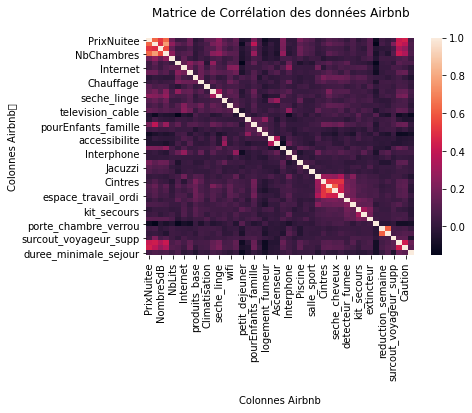

In [29]:
hm = sns.heatmap(df_corr.corr(), annot = False)

hm.set(xlabel='\nColonnes Airbnb', ylabel='Colonnes Airbnb\t', title = "Matrice de Corrélation des données Airbnb\n")
plt.savefig("../images/matrice_correlation.png")
plt.show()

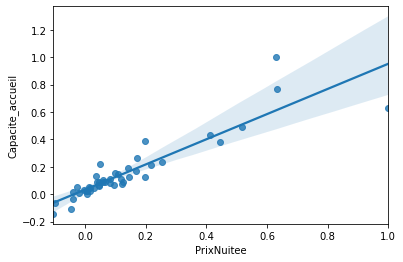

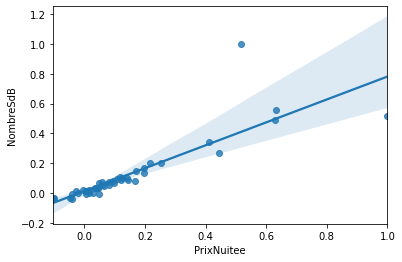

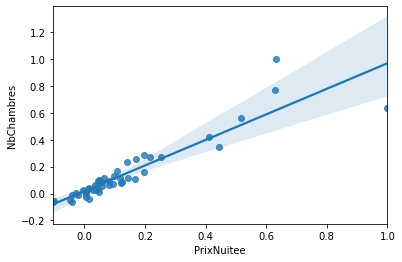

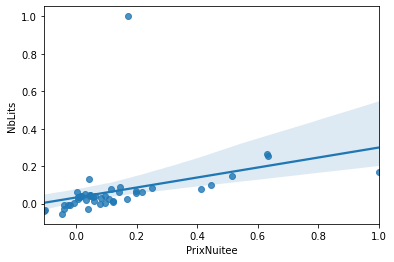

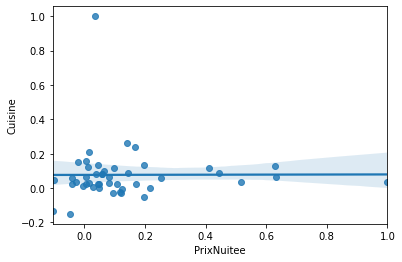

...

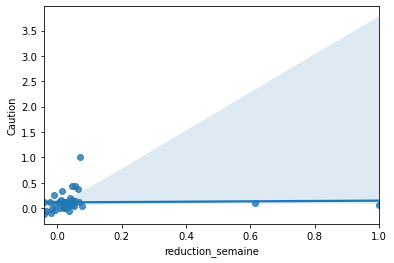

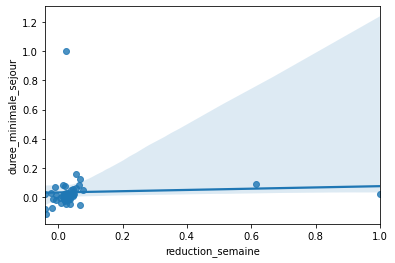

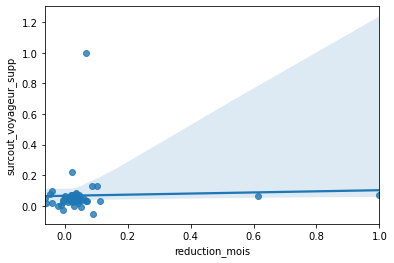

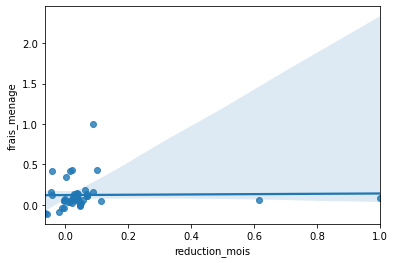

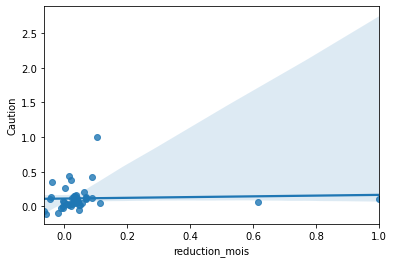

In [ ]:
#enregsitrement des images des regressions lineaires dans le folder local
list_values = []
for col1 in corr:
    for col2 in corr:
        col_start = corr.columns.get_loc(col1)
        col_end = corr.columns.get_loc(col2)
        corr.iloc[col_start, col_end]
        if corr.iloc[col_start, col_end] >= 0 and corr.iloc[col_start, col_end] < 1 :
            list_values.append(col1 + "_" + col2)
            if col1 != col2 and (col2 + "_" + col1) in list_values:
                pass
            else:
                sns.regplot(x=corr[col1], y=corr[col2])
                   
                if corr.iloc[col_start, col_end] >= 0.9 :
                    disk = "90_100";
                elif corr.iloc[col_start, col_end] >= 0.8 and corr.iloc[col_start, col_end] < 0.9:
                    disk = "80_90";
                elif corr.iloc[col_start, col_end] >= 0.7 and corr.iloc[col_start, col_end] < 0.8:
                    disk = "70_80";
                elif corr.iloc[col_start, col_end] >= 0.6 and corr.iloc[col_start, col_end] < 0.7:
                    disk = "60_70";
                elif corr.iloc[col_start, col_end] >= 0.5 and corr.iloc[col_start, col_end] < 0.6:
                    disk = "50_60";
                elif corr.iloc[col_start, col_end] >= 0.4 and corr.iloc[col_start, col_end] < 0.5:
                    disk = "40_50";
                elif corr.iloc[col_start, col_end] >= 0.3 and corr.iloc[col_start, col_end] < 0.4:
                    disk = "30_40";
                elif corr.iloc[col_start, col_end] >= 0.2 and corr.iloc[col_start, col_end] < 0.3:
                    disk = "20_30";
                elif corr.iloc[col_start, col_end] >= 0.1 and corr.iloc[col_start, col_end] < 0.2:
                    disk = "10_20";
                elif corr.iloc[col_start, col_end] >= 0 and corr.iloc[col_start, col_end] < 0.1:
                    disk = "0_10";
                else:
                    disk = "unclassified"

                url_image_correl = "../images/regression_fit/" + disk + "/" + col1+ "_"+ col2+ ".jpg"
                #plt.show()
                #plt.savefig(url_image_correl)
                
                fig1 = plt.gcf()
                plt.show()
                plt.draw()
                fig1.savefig(url_image_correl, dpi=100)

0.6293549907469272
PrixNuitee _ Capacite_accueil


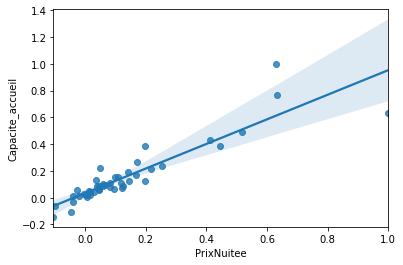

0.6328719551661859
PrixNuitee _ NbChambres


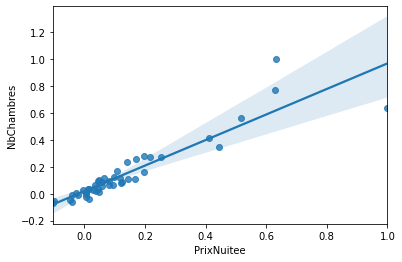

<Figure size 432x288 with 0 Axes>

In [30]:
list_values2 = []

for col1 in corr:
    for col2 in corr:
        col_start = corr.columns.get_loc(col1)
        col_end = corr.columns.get_loc(col2)
        corr.iloc[col_start, col_end]
        if corr.iloc[col_start, col_end] >= 0.60 and corr.iloc[col_start, col_end] < 1 :
            list_values2.append(col1 + "__" + col2)
            if (col2 + "__" + col1) in list_values2:
                pass
            else:
                if col1 == 'PrixNuitee' or col2 == 'PrixNuitee':
                    print(corr.iloc[col_start, col_end])
                    print(col1, "_", col2)
                    sns.regplot(x=corr[col1], y=corr[col2])

                    plt.show()       

In [21]:
liste_quartier = []

for i, row in df.iterrows():
    longitude = df.at[i, 'Longitude']
    latitude = df.at[i, 'Latitude']

    point_to_check = (longitude, latitude) # an x,y tuple
    shp = shapefile.Reader('../Data/se_quart_s/se_quart_s.shp') #open the shapefile
    all_shapes = shp.shapes() # get all the polygons
    all_records = shp.records()     
    for j in range(len(all_shapes)):
        boundary = all_shapes[j] # get a boundary polygon
        if Point(point_to_check).within(shape(boundary)): # make a point and see if it's in the polygon
            name = all_records[j][2] # get the second field of the corresponding record
            if name in liste_quartier:
                pass
            else:
                liste_quartier.append(name)
print(liste_quartier)

['Centre ville', 'Chartrons - Grand Parc - Jardin Public', 'Saint Augustin - Tauzin - Alphonse Dupeux', 'Bordeaux Sud', 'Nansouty - Saint Genès', 'La Bastide', 'Bordeaux Maritime', 'Caudéran']


In [24]:
df['type_propriete'].unique()

array(['Maison', 'Appartement', 'Bed & Breakfast', 'Maison de ville',
       'Loft', 'Cabane', 'Appartement en résidence', 'Bungalow',
       'Inconnue', 'Maison écologique', 'Villa', 'Dortoir', 'Autre'],
      dtype=object)